# **UGST4085 — Numerical Methods in Calculus and Algebra 2025/26 Fall**  
## Finite difference schemes for two variable functions - Rumor Spreading Simulation

**Name:** Zeteny Cseresznyes

**Email:** [cseresznyes_zeteny@student.ceu.edu](mailto:cseresznyes_zeteny@student.ceu.edu)  


**Name:** Balazs Remenyi

**Email:** [remenyi_balazs@student.ceu.edu](mailto:remenyi_balazs@student.ceu.edu)


**Name:** Shiwam KC

**Email:** [kc_shiwam@student.ceu.edu](mailto:kc_shiwam@student.ceu.edu)

*Date:* 07.12.2025.

## **Importing Modules**

In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from datetime import datetime
from IPython.display import HTML

## **Laplacian Equation**

We are intorducing the Laplacian equation as the following:
$$
\nabla^2 \phi(x,y) = 0
$$

Since we are in two dimensions,
$$
\nabla^2 \phi(x,y)
= \frac{\partial^2 \phi(x,y)}{\partial x^2}
+ \frac{\partial^2 \phi(x,y)}{\partial y^2}.
$$

This equation in its discrete form can be approximated as:
$$
\nabla^2 \phi(x,y) \approx 
\frac{\phi(x_{i+1},y_j) - 2\phi(x_i,y_j) + \phi(x_{i-1},y_j)}{(\Delta x)^2}
+
\frac{\phi(x_i, y_{j+1}) - 2\phi(x_i,y_j) + \phi(x_i,y_{j-1})}{(\Delta y)^2}
= 0,
$$
Noting that due to $\Delta x = \Delta y$, this can be simplified to
$$
\nabla^2 \phi(x,y) \approx 
\frac{\phi(x_{i+1},y_j + \phi(x_{i-1},y_j) + \phi(x_i, y_{j+1}) + \phi(x_i,y_{j-1})}{4} = 0.
$$
The visual representation of the 5-point stencil:
$$
\boxed{
\begin{array}{ccccc}
 & & \phi(x_i, y_{j+1}) & & \\
 &&|&& \\
\phi(x_{i-1},y_j) & - &\phi(x_i,y_j)& - &\phi(x_{i+1},y_j \\
 &&|&& \\
 && \phi(x_i,y_{j-1}) & &
\end{array}}
$$
Furthermore, on the grid:
$$
\begin{array}{ccccccccc}
&\vdots&&\vdots&&\vdots&&\vdots&&\vdots& \\
\cdots & \phi(x_{i-2}, y_{j+2}) & - & \phi(x_{i-1}, y_{j+2}) & - & \phi(x_i, y_{j+2}) & - & \phi(x_{i+1}, y_{j+2}) & - & \phi(x_{i+2}, y_{j+2}) & \cdots\\
&|&&|&&|&&|&&|& \\
\cdots & \phi(x_{i-2}, y_{j+1}) & - & \phi(x_{i-1}, y_{j+1}) & - & \phi(x_i, y_{j+1}) & - & \phi(x_{i+1}, y_{j+1}) & - & \phi(x_{i+2}, y_{j+1}) & \cdots\\
&|&&|&&|&&|&&|& \\
\cdots & \phi(x_{i-2}, y_{j}) & - & \phi(x_{i-1},y_j) & - &\phi(x_i,y_j)& - &\phi(x_{i+1},y_j) & - & \phi(x_{i+2}, y_{j}) & \cdots\\
&|&&|&&|&&|&&|& \\
\cdots & \phi(x_{i-2}, y_{j-1}) & - & \phi(x_{i-1}, y_{j-1}) & - & \phi(x_i,y_{j-1}) & - & \phi(x_{i+1}, y_{j-1}) & - & \phi(x_{i+2}, y_{j-1}) & \cdots\\
&|&&|&&|&&|&&|& \\
\cdots & \phi(x_{i-2}, y_{j-2}) & - & \phi(x_{i-1}, y_{j-2}) & - & \phi(x_i,y_{j-2}) & - & \phi(x_{i+1}, y_{j-2}) & - & \phi(x_{i+2}, y_{j-2}) & \cdots \\
&\vdots&&\vdots&&\vdots&&\vdots&&\vdots&
\end{array}
$$

In [2]:
def laplacian(A):
    return (
        np.roll(A, +1, 0) +
        np.roll(A, -1, 0) +
        np.roll(A, +1, 1) +
        np.roll(A, -1, 1) -
        4 * A
    )

## **Parameters and Growth Function**

For the simulation, we define variables as the following: the space of the simulation will be an $n \times n$ grid (denoted by ```'n'```), $D$ will be the diffusion coefficient (```'D'```), $\partial t$ will be the time step (```'dt'```), $\varepsilon$ is a an adjustment to avoid division by zero (```'eps'```), $\phi_{m}$ is the maximum spreading (```'max_rumor'```), $\alpha$ and $\beta$ are exponents to ensure nonlinearity in the simulation (```'alpha'```, ```'beta'```), $\mathcal{N}_{x_i,y_j}$ is the average of neigbors (```'neigbors'```), $\phi(x_i,y_j)_{+}$ and $\phi(x_i,y_j)_{-}$ are the growth and decay terms in the rumor function (```'growth_term'```, ```'decay_term'```), the rumor growth function is $\phi(x_i,y_j)$ (```'growth(rumor)'```).

$$
\begin{aligned}
n &= 100 \\
D &= 0.3 \\
\partial t &= 0.75 \\
\varepsilon &= 10^{-12} \\
\phi_{m} &= 1 \\
\alpha &= 6 \\
\beta &= 3 \\
\end{aligned}
\quad \quad \quad \quad \quad
\begin{aligned}
\mathcal{N}_{x_i,y_j} &= \frac{\phi(x_{i+1},y_j) + \phi(x_{i-1},y_j) + \phi(x_i,y_{j+1}) + \phi(x_i,y_{j-1})}{4} \\

\phi(x_i,y_j)_{+} &= (\mathcal{N}_{x_i,y_j} + \varepsilon)^{\alpha} \cdot \max|\phi_{m} - \phi(x_i,y_j), 0|^{\beta} \\

\phi(x_i,y_j)_{-} &= \phi(x_i,y_j) \left( 1 - \frac{\mathcal{N}_{x_i,y_j}}{\phi_{m} + \varepsilon} \right) \\

\phi(x_i,y_j) &= \phi(x_i,y_j)_{+} - \phi(x_i,y_j)_{-}
\end{aligned}
$$

We denote the rumor growth function as $G(\phi,\mathcal{N}[\phi])$.

In [3]:
# grid size (nxn)
n = 100

# diffusion coefficient (how fast rumor spreads)
D = 0.4

# simulated time step
dt = 0.75

# initial field of rumor
rumor = np.zeros((n, n))

# exponents for growth dynamics (same)
alpha, beta = 6, 3

# small epsilon so noise doesn't explode
eps = 1e-12

# maximum rumor fraction
max_rumor = 1

# definition of rumor growth function
def growth(rumor):
    
    # average of 4 neighbors (periodic)
    neighbors = 0.25 * (
        np.roll(rumor, 1, 0) +
        np.roll(rumor, -1, 0) +
        np.roll(rumor, 1, 1) +
        np.roll(rumor, -1, 1)
    )
    
    # logistic-like growth
    growth_term = (neighbors + eps)**alpha * (np.maximum(max_rumor - rumor, 0))**beta

    # inhibition: rumor dies if neighbors do not believe it enough
    decay_term = rumor * (1 - neighbors / (max_rumor + eps))

    return growth_term - decay_term

# initial random starting point
np.random.seed(42)
start_x, start_y = np.random.randint(0, n, size=2)
rumor[start_x, start_y] = 0.05  # make sure that rumor overcomes threshold

## **Reaction - Diffusion Equation**

The function describing the simulation of rumor spreading is defined as the following:
$$
\frac{\partial \phi}{\partial t}
= D \cdot \nabla^2 \phi  + G(\phi,\mathcal{N}[\phi])
$$

In [ ]:
# simulation function for animation
def update(frame):
    global rumor
    
    # compute laplacian
    lap = laplacian(rumor)

    # compute nonlinear growth
    growth_value = growth(rumor)

    # update rumor with diffusion and nonlinear growth
    rumor += D * lap * dt + growth_value * dt

    # ensure rumor values stay within bounds
    rumor = np.clip(rumor, 0, max_rumor)
    
    # update the image data
    im.set_data(rumor)
    
    # save snapshots at specific frames
    snapshot_frames = [2, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200]
    if frame in snapshot_frames:
        plt.savefig(f"rumor_animation_snapshot_frame_{frame}.jpg", dpi=150)

    return [im]

## **Simulation and Animation**

And now we run the simulation 400 times.

Animation saved to: 'rumor_animation_202512071944.gif'.


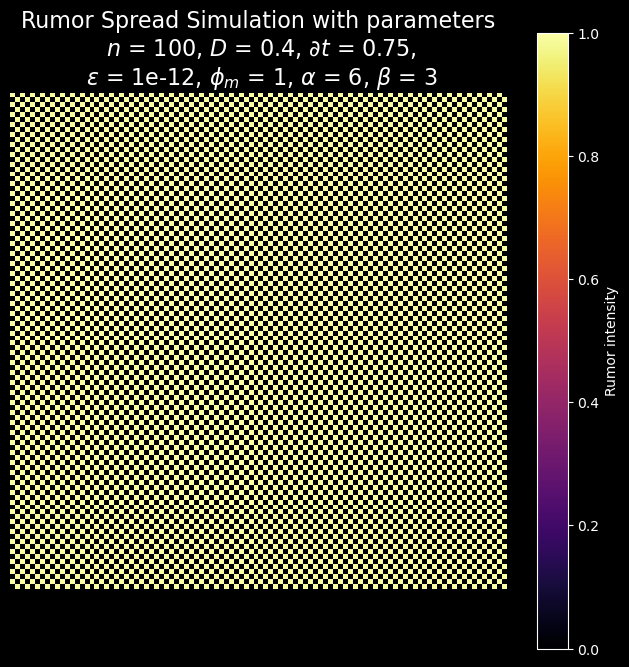

In [5]:
# setup the figure and animation
plt.style.use('dark_background')
fig, ax = plt.subplots(figsize=(8,8))
im = ax.imshow(rumor, cmap="inferno", vmin=0, vmax=max_rumor, animated=True)
ax.axis("off")

# colorbar
cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Rumor intensity")

# title
ax.set_title(f"Rumor Spread Simulation with parameters\n $n$ = {n}, $D$ = {D}, $\\partial t$ = {dt},\n $\\varepsilon$ = {eps}, $\phi_m$ = {max_rumor}, $\\alpha$ = {alpha}, $\\beta$ = {beta}",
             fontsize=16, color='white')

# create the animation
anim = FuncAnimation(fig, update, frames=400, interval=200)

# save the animation as gif
filename = 'rumor_animation_' + str(datetime.today().strftime('%Y%m%d%H%M')) + '.gif'
anim.save(filename, writer=PillowWriter(fps=10))
print(f"Animation saved to: '{filename}'.")

# show animation in notebook
HTML(anim.to_jshtml())